In [1]:
import shioaji

ModuleNotFoundError: No module named 'shioaji'

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import numba as nb
import pandas_ta as ta
import os
import datetime
import json
from tabulate import tabulate
import sys
sys.path.append('../..')
import vectorbtpro as vbt
from vectorbtpro.portfolio.enums import SizeType
from src.utils import fu
from src.utils import plot_return_mdd
from src.strategy.BackTester import BackTester
from src.strategy.Analyzer import Analyzer
from src.strategy.MultiTester import MultiTester
from src.utils import plot_return_mdd,twinx_plot # as utils
from kd_smoother import get_data,Strategy

In [2]:
import pandas as pd
import json

symbol_list = ['ETH','BTC','BNB','SOL','MATIC',
               'XRP','DYDX','AVAX','LINK','GAS',
               'DOGE','ORDI','TRB','WLD','ADA',
               'OP','FIL','ZRX','LTC','RUNE','ATOM',
               'ARB','GMT','ETC','ARK','BCH','DOT',
               '1000PEPE','LDO','SUI','GALA','CAKE',
               'APE','INJ','FTM','APT','YFI','OMG',
               'SEI','EOS','1000SHIB','NEAR','STORJ',
               '1000FLOKI','MKR','CYBER','UNI','STRAX',
               'BLUR','SUSHI','WAVES','MASK','MANA',
               'EGLD','AAVE','NEO','FET','TRX','GRT','ALGO','STX','XLM']

params_dict = {}
for freq in ['5T','15T','1h','4h']:
    params_dict[freq] = {}
    for coin in symbol_list:
        params_dict[freq][coin] = {}
        for direction in ['long','short']:
            params_dict[freq][coin][direction] = {}
            i = 0
            try:
                params_df = pd.read_csv(f'opt/{freq}/{coin}/{direction}_record_df.csv').drop(columns=['Unnamed: 0'])
                for _ , row in params_df[params_df['Sharpe Ratio']>2].iterrows():
                    params_dict[freq][coin][direction][str(i)] = row['params']
                    i += 1
            except Exception as e:
                pass
        try:
            if len(params_dict[freq][coin]['long'])==0 or len(params_dict[freq][coin]['short']==0):
                params_dict[freq].pop(coin)
        except:
            pass
            
filename = "params.json"

with open(filename, 'w') as file:
    json.dump(params_dict, file, indent=4)

In [12]:
df_dict = {}
candidate = ['ETH','BTC','BNB','SOL','MATIC',
               'XRP','DYDX','AVAX','LINK','GAS',
               'DOGE','ORDI','TRB','WLD','ADA',
               'OP','FIL','ZRX','LTC','RUNE','ATOM',
               'ARB','GMT','ETC','ARK','BCH','DOT',
               'LDO','SUI','GALA','CAKE',
               'APE','INJ','FTM','APT','YFI','OMG',
               'SEI','EOS','1000SHIB','NEAR',
               'MKR','CYBER','UNI',
               'BLUR','SUSHI','WAVES','MASK','MANA',
               'EGLD','AAVE','NEO','FET','TRX','GRT','ALGO','STX','XLM']
for coin in candidate:
    df_dict[coin] = pd.read_hdf(f'/Users/johnsonhsiao/Desktop/data/{coin}USDT_PERPETUAL.h5')

# SOL

### 樣本內全參數 (多、空)

In [5]:
import ast
import pandas as pd
import hiplot as hip

def insample_params_highland(coin:str, freq: str, dirction: str):
    params_df = pd.read_csv(f'opt/{coin}-{freq}/{dirction}_record_df.csv').drop(columns=['Unnamed: 0'])
    params_df['params'] = params_df['params'].apply(ast.literal_eval)
    temp_df = params_df['params'].apply(pd.Series)
    df = pd.concat([params_df.drop(columns='params'), temp_df], axis=1)
    target = df[['window_l_k','window_l_d','window_s_k','window_s_d','Sharpe Ratio','Calmar Ratio','Win Rate [%]']]
    data_for_hiplot = target.to_dict(orient='records')
    exp = hip.Experiment.from_iterable(data_for_hiplot)
    exp.display(force_full_width=False, width=400, height=100)


In [41]:
freq = '1h'
for direction in ['long','short']:
    print(f'-------------------------frequency:{freq}----------------------direction:{direction}---------------------')
    insample_params_highland('SOL',freq,  direction)

-------------------------frequency:1h----------------------direction:long---------------------


<IPython.core.display.Javascript object>

-------------------------frequency:1h----------------------direction:short---------------------


<IPython.core.display.Javascript object>

### 樣本外
取樣本內前500參數來看樣本外表現


In [2]:
df_dict = {}
candidate = ['SOL','XRP','ETH']
for coin in candidate:
    df_dict[coin] = get_data(coin)

In [14]:
from tqdm.auto import tqdm
start = '2022-01-01'
sep = ''
end = ''

def outample_params_highland(freq, side, coin):
    outsample_record = []
    params_df = pd.read_csv(f'/Users/johnsonhsiao/DC_capital_intern/strategy_research/CTA_TEST/Crypto/kd_smoother/opt/{freq}/{coin}/{direction}_record_df.csv')
    for idx , row in tqdm(params_df[:int(len(params_df)/2)].iterrows(), total=int(len(params_df)/2), desc="Processing"):
        params = eval(row['params'])
        # sol 1h : 40,48,100,126,95
        config = {'freq':freq, 'lag':1, 'fee': 0.0003,'weekend_filter':False}
        df = df_dict[coin]
        strategy = Strategy(df=df.loc[start:], configs=config,)
        analyze = Analyzer(strategy)
        mdd, stat = analyze.outsample_result_gen(params, side, coin, axv_index=['2023-05-01'])
        params['mdd'] = mdd
        params['sharpe'] = stat['Sharpe Ratio']
        params['calmar'] = stat['Calmar Ratio']
        params['win rate'] = stat['Win Rate [%]']
        outsample_record.append(params)
    exp = hip.Experiment.from_iterable(outsample_record)
    exp.display()


In [15]:
import hiplot as hip
freq = '1h'
for direction in ['long']:
    print(f'-------------------------frequency:{freq}----------------------direction:{direction}---------------------')
    outample_params_highland('15T', direction, 'RUNE')


-------------------------frequency:1h----------------------direction:long---------------------


Processing:   0%|          | 0/420 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

In [21]:
import hiplot as hip
freq = '1h'
for direction in ['long']:
    print(f'-------------------------frequency:{freq}----------------------direction:{direction}---------------------')
    outample_params_highland('1h', direction, 'SOL')

-------------------------frequency:1h----------------------direction:long---------------------


Processing:   0%|          | 0/2000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

### 挑選參數全樣本結果

APY: 204.68 %
MDD: 16.75 %
MDD Duration 103 days 07:00:00
worst trade: -19.75 %
2022-05-31 03:00:00 ~ 2022-06-03 20:00:00
avg holding days: 6.17 days
--------------------------------------------
PF: 2.43
Sharpe Ratio: 2.54
Calmar Ratio: 7.90
Sortino Ratio: 3.86
Omega Ratio: 1.11
--------------------------------------------
Expectancy : 4.24 %
Total Time Exposure : 79.76 %
Total Trades: 88
Win Rate: 52.87 %
--------------------------------------------
PF * Win Rate: 1.286


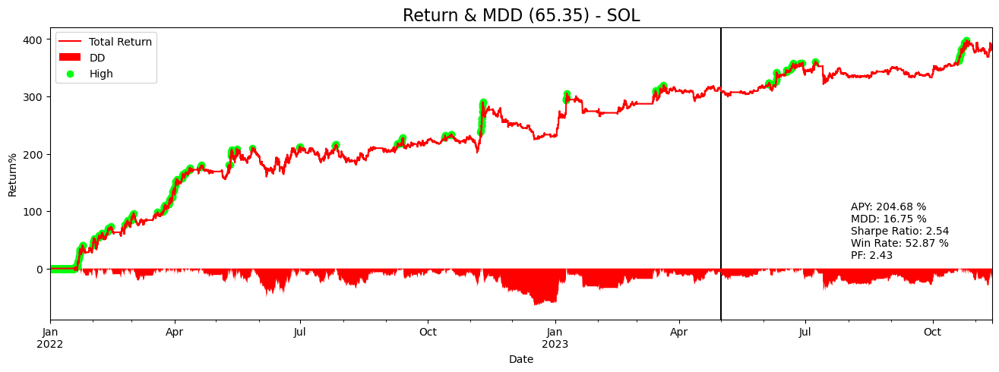

(None,
 Start                               2022-01-01 00:00:00
 End                                 2023-11-13 00:00:00
 Period                                681 days 01:00:00
 Start Value                                     10000.0
 Min Value                                   9603.921643
 Max Value                                   49786.52608
 End Value                                  48187.702489
 Total Return [%]                             381.877025
 Benchmark Return [%]                         -67.334687
 Total Time Exposure [%]                       79.755277
 Max Gross Exposure [%]                       108.185807
 Max Drawdown [%]                              16.750718
 Max Drawdown Duration                 103 days 07:00:00
 Total Orders                                        163
 Total Fees Paid                              526.284028
 Total Trades                                         88
 Win Rate [%]                                  52.873563
 Best Trade [%]         

In [3]:
start = '2022-01-01'
sep = ''
end = ''

side = 'both'

params = {'window_l_k': 172, 'window_l_d': 104, 'window_s_k': 104, 'window_s_d': 120}

# sol 1h : 40,48,100,126,95 original
config = {'freq':'1h', 'lag':1, 'fee': 0.0003}
coin = 'SOL'
df = df_dict[coin]
strategy = Strategy(df=df.loc[start:], configs=config)
_pf = strategy.strategy(side = side,params=params)
trades = _pf.trades.records_readable
analyze = Analyzer(strategy)
analyze.show_pf_analysis(params, side, coin, axv_index=['2023-05-01'])

### XRP

In [42]:
import hiplot as hip
freq = '1h'
for direction in ['long','short']:
    print(f'-------------------------frequency:{freq}----------------------direction:{direction}---------------------')
    outample_params_highland('1h', direction, 'XRP')

-------------------------frequency:1h----------------------direction:long---------------------


Processing:   0%|          | 0/2000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

-------------------------frequency:1h----------------------direction:short---------------------


Processing:   0%|          | 0/2000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

APY: 126.10 %
MDD: 14.54 %
MDD Duration 113 days 18:00:00
worst trade: -12.35 %
2022-11-12 10:00:00 ~ 2022-11-14 05:00:00
avg holding days: 3.90 days
--------------------------------------------
PF: 2.50
Sharpe Ratio: 2.08
Calmar Ratio: 6.27
Sortino Ratio: 3.32
Omega Ratio: 1.10
--------------------------------------------
Expectancy : 2.18 %
Total Time Exposure : 61.91 %
Total Trades: 108
Win Rate: 54.21 %
--------------------------------------------
PF * Win Rate: 1.354


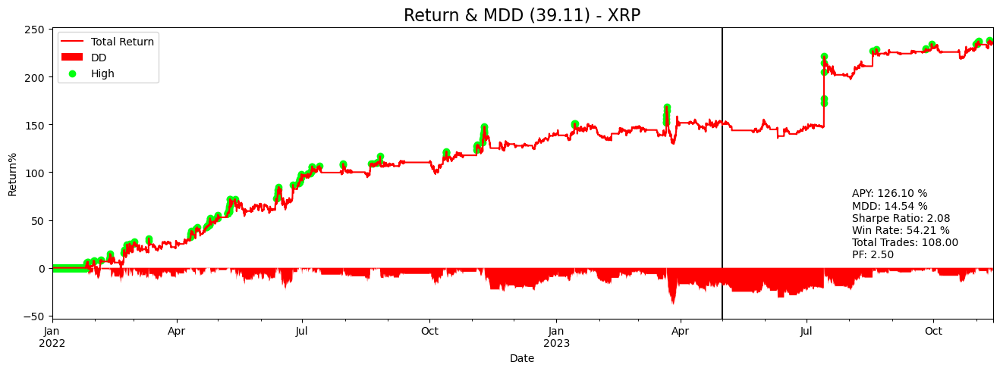

(None,
 Start                               2022-01-01 00:00:00
 End                                 2023-11-12 23:00:00
 Period                                681 days 00:00:00
 Start Value                                     10000.0
 Min Value                                   9521.242773
 Max Value                                  33823.937123
 End Value                                  33493.468836
 Total Return [%]                             234.934688
 Benchmark Return [%]                         -20.674452
 Total Time Exposure [%]                       61.912628
 Max Gross Exposure [%]                       108.371221
 Max Drawdown [%]                              14.544371
 Max Drawdown Duration                 113 days 18:00:00
 Total Orders                                        206
 Total Fees Paid                              645.854756
 Total Trades                                        108
 Win Rate [%]                                  54.205607
 Best Trade [%]         

In [3]:
start = '2022-01-01'
sep = ''
end = ''

side = 'both'

params = {'window_l_k': 80, 'window_l_d': 76, 'window_s_k': 104, 'window_s_d': 68}

config = {'freq':'1h', 'lag':1, 'fee': 0.0003}
coin = 'XRP'
df = df_dict[coin]
strategy = Strategy(df=df.loc[start:], configs=config)
_pf = strategy.strategy(side = side,params=params)
trades = _pf.trades.records_readable
analyze = Analyzer(strategy)
analyze.show_pf_analysis(params, side, coin, axv_index=['2023-05-01'])

### ETH

In [10]:
import hiplot as hip
freq = '1h'
for direction in ['long','short']:
    print(f'-------------------------frequency:{freq}----------------------direction:{direction}---------------------')
    outample_params_highland('1h', direction, 'ETH')

-------------------------frequency:1h----------------------direction:long---------------------


Processing:   0%|          | 0/2000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

-------------------------frequency:1h----------------------direction:short---------------------


Processing:   0%|          | 0/2000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

APY: 128.45 %
MDD: 15.98 %
MDD Duration 95 days 01:00:00
worst trade: -10.75 %
2022-09-07 04:00:00 ~ 2022-09-09 03:00:00
avg holding days: 5.29 days
--------------------------------------------
PF: 2.64
Sharpe Ratio: 2.16
Calmar Ratio: 5.79
Sortino Ratio: 3.26
Omega Ratio: 1.10
--------------------------------------------
Expectancy : 2.47 %
Total Time Exposure : 75.38 %
Total Trades: 97
Win Rate: 52.58 %
--------------------------------------------
PF * Win Rate: 1.385


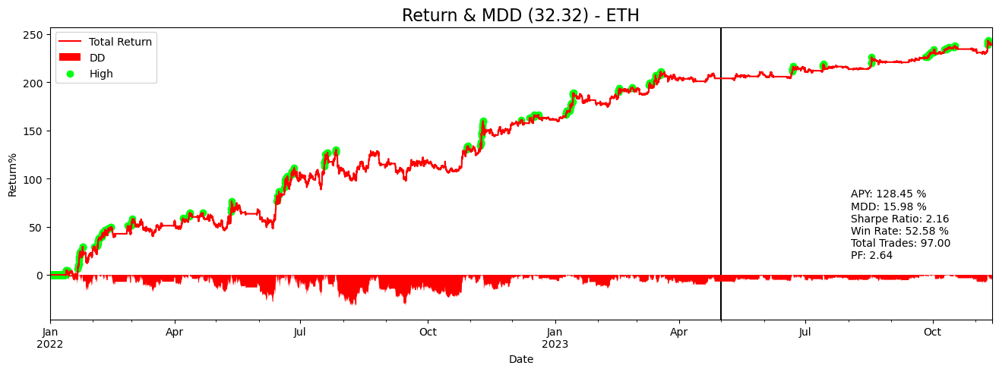

(None,
 Start                               2022-01-01 00:00:00
 End                                 2023-11-12 23:00:00
 Period                                681 days 00:00:00
 Start Value                                     10000.0
 Min Value                                   9524.910264
 Max Value                                  34363.056868
 End Value                                  33929.683914
 Total Return [%]                             239.296839
 Benchmark Return [%]                         -44.573538
 Total Time Exposure [%]                       75.379344
 Max Gross Exposure [%]                        108.13714
 Max Drawdown [%]                              15.981857
 Max Drawdown Duration                  95 days 01:00:00
 Total Orders                                        185
 Total Fees Paid                              582.121873
 Total Trades                                         97
 Win Rate [%]                                   52.57732
 Best Trade [%]         

In [3]:
start = '2022-01-01'
sep = ''
end = ''

side = 'both'

params = {'window_l_k': 48, 'window_l_d': 132, 'window_s_k': 52, 'window_s_d': 140}
# sol 1h : 40,48,100,126,95 original
config = {'freq':'1h', 'lag':1, 'fee': 0.0003}
coin = 'ETH'
df = df_dict[coin]
strategy = Strategy(df=df.loc[start:], configs=config)
_pf = strategy.strategy(side = side,params=params)
trades = _pf.trades.records_readable
analyze = Analyzer(strategy)
analyze.show_pf_analysis(params, side, coin, axv_index=['2023-05-01'])